# Machine Learning Engineer Nanodegree
## Deep Learning
## Project: Build a Digit Recognition Program

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

----
## Step 1: Design and Test a Model Architecture
Design and implement a deep learning model that learns to recognize sequences of digits. Train the model using synthetic data generated by concatenating character images from [notMNIST](http://yaroslavvb.blogspot.com/2011/09/notmnist-dataset.html) or [MNIST](http://yann.lecun.com/exdb/mnist/). To produce a synthetic sequence of digits for testing, you can for example limit yourself to sequences up to five digits, and use five classifiers on top of your deep network. You would have to incorporate an additional ‘blank’ character to account for shorter number sequences.

There are various aspects to consider when thinking about this problem:
- Your model can be derived from a deep neural net or a convolutional network.
- You could experiment sharing or not the weights between the softmax classifiers.
- You can also use a recurrent network in your deep neural net to replace the classification layers and directly emit the sequence of digits one-at-a-time.

Here is an example of a [published baseline model on this problem](http://static.googleusercontent.com/media/research.google.com/en//pubs/archive/42241.pdf). ([video](https://www.youtube.com/watch?v=vGPI_JvLoN0))

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [1]:
# import pacage needed
from __future__ import print_function
import numpy as np
import tensorflow as tf
from six.moves import cPickle as pickle
from PIL import Image
import csv
import os
import matplotlib.pyplot as plt
import pandas as pd
import cPickle as pk
%matplotlib inline

In [27]:
# generate trainning dataset, labels
def chunks(l, n):
    n = max(1, n)
    return (l[i:i+n] for i in xrange(0, len(l), n))
csv_reader = csv.reader(open('digitStruct_train.csv'))
train_labels = []
train_dataset = []
train_local = []
data = {}
num = 0
for temp in csv_reader:
#    temp = csv_reader.next()
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp
    num = num + 1


#print (len(data.keys()),"length",num)
image_files = os.listdir("train")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
for key in image_files:
    temp = data[key]
    label = []
    loc = {}
    loc['up'] = []
    loc['down'] = []
    loc['left'] = []
    loc['right'] = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
        loc['left'].append(int(c[2]))
        loc['up'].append(int (c[3]))
        loc['right'].append(int(c[2]) + int(c[4]))
        loc['down'].append(int(c[3]) + int(c[5]))
    
    for i in range(temp.count(key),5):
        label.append(0)
    if(len(label)!=6):
        continue
    train_local.append((min(loc['left']),min(loc['up']),max(loc['right']),max(loc['down'])))
    train_labels.append(label)
    img = Image.open("train/" + key)
    img = img.resize((160,80))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    train_dataset.append(sdata)
# print (np.shape(train_labels))
# print (train_labels[0],image_files[0],train_local[0])
# img = Image.open("train/" + image_files[0])
# img = img.crop(train_local[0])
# img.show()
#image_files = os.listdir("train")
# for row in csv_reader:
#     image = os.path.join("test", row[0])
#     train_labels.append(row[1])
#     img = Image.open(image)
#     img = img.resize((64,64))

        

In [28]:
# generate testing dataset, labels
csv_reader = csv.reader(open('digitStruct_test.csv'))
test_labels = []
test_dataset = []
test_local = []
data = {}
num = 0
for temp in csv_reader:
#    temp = csv_reader.next()
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp


#print (len(data.keys()),"length",num)
image_files = os.listdir("test")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
for key in image_files:
    temp = data[key]
    label = []
    loc = {}
    loc['up'] = []
    loc['down'] = []
    loc['left'] = []
    loc['right'] = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
        loc['left'].append(int(c[2]))
        loc['up'].append(int (c[3]))
        loc['right'].append(int(c[2]) + int(c[4]))
        loc['down'].append(int(c[3]) + int(c[5]))
    
    for i in range(temp.count(key),5):
        label.append(0)
    test_local.append((min(loc['left']),min(loc['up']),max(loc['right']),max(loc['down'])))
    test_labels.append(label)
    img = Image.open("test/" + key)
    img = img.resize((160,80))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    test_dataset.append(sdata)

In [29]:
train_dataset = np.asarray(train_dataset)
train_labels = np.asarray(train_labels)
train_local = np.asarray(train_local)
test_local = np.asarray(test_local)
test_dataset = np.asarray(test_dataset)
test_labels = np.asarray(test_labels)
# valid_local = np.asarray(valid_local)
# valid_dataset = np.asarray(valid_dataset)
# valid_labels = np.asarray(valid_labels)
valid_dataset = test_dataset[:3000]
valid_labels = test_labels[:3000]
valid_local = test_local[:3000]
print (np.shape(valid_dataset),np.shape(valid_labels))
test_dataset = test_dataset[3000:]
test_labels = test_labels[3000:]
test_local = test_local[3000:]

(3000, 12800) (3000, 6)


In [30]:
def da():
    print('Training set', train_dataset.shape, train_labels.shape,train_local.shape)
    print('Test set', test_dataset.shape, test_labels.shape,test_local.shape)
    print('Validation Set',valid_dataset.shape,valid_labels.shape,valid_local.shape)
da()
# valid_dataset = valid_dataset.reshape(3000,160,80,1)
# test_dataset = test_dataset.reshape(10068,160,80,1)
# train_dataset = train_dataset.reshape(33401,160,80,1)
valid_dataset = valid_dataset.astype(np.float32)
test_dataset = test_dataset.astype(np.float32)

Training set (33401, 12800) (33401, 6) (33401, 4)
Test set (10068, 12800) (10068, 6) (10068, 4)
Validation Set (3000, 12800) (3000, 6) (3000, 4)


In [31]:
train_dataset = train_dataset.reshape(33401,160,80,1)
valid_dataset = valid_dataset.reshape(3000,160,80,1)
test_dataset = test_dataset.reshape(10068,160,80,1)

In [47]:
batch_size = 16
patch_size = 3
depth = 16
num_hidden = 64
num_channels = 1
LEARN_RATE = 0.03
graph = tf.Graph()
shape = (batch_size, 160, 80, num_channels)
with graph.as_default():

  # Input data.
  tf_train_dataset = tf.placeholder(
    tf.float32, shape=(batch_size, 160, 80, num_channels))
  tf_train_labels = tf.placeholder(tf.int64, shape=(batch_size, 6))
  tf_valid_dataset = tf.constant(valid_dataset)
  tf_test_dataset = tf.constant(test_dataset)
  
  # Variables.
  layer1_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, num_channels, depth], stddev=0.1))
  layer1_biases = tf.Variable(tf.zeros([depth]))
  layer2_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, depth, depth*2], stddev=0.1))
  layer2_biases = tf.Variable(tf.constant(1.0, shape=[depth*2]))

  layer3_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, depth*2, depth*2], stddev=0.1))
  layer3_biases = tf.Variable(tf.zeros([depth*2]))
  layer4_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, depth*2, depth*4], stddev=0.1))
  layer4_biases = tf.Variable(tf.constant(1.0, shape=[depth*4]))

  layer5_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, depth*4, depth*4], stddev=0.1))
  layer5_biases = tf.Variable(tf.zeros([depth*4]))
  layer6_weights = tf.Variable(tf.truncated_normal(
      [patch_size, patch_size, depth*4, depth*8], stddev=0.1))
  layer6_biases = tf.Variable(tf.constant(1.0, shape=[depth*8]))

  layer7_weights = tf.Variable(tf.truncated_normal(
      [25600, 16*8], stddev=0.1))
  layer7_biases = tf.Variable(tf.constant(1.0, shape=[16*8]))

  c1_weights = tf.Variable(tf.truncated_normal(
      [16*8, 6], stddev=0.1))
  c1_biases = tf.Variable(tf.constant(1.0, shape=[6]))
  c2_weights = tf.Variable(tf.truncated_normal(
      [16*8, 6], stddev=0.1))
  c2_biases = tf.Variable(tf.constant(1.0, shape=[6]))
  c3_weights = tf.Variable(tf.truncated_normal(
      [16*8, 6], stddev=0.1))
  c3_biases = tf.Variable(tf.constant(1.0, shape=[6]))
  c4_weights = tf.Variable(tf.truncated_normal(
      [16*8, 6], stddev=0.1))
  c4_biases = tf.Variable(tf.constant(1.0, shape=[6]))
  c5_weights = tf.Variable(tf.truncated_normal(
      [16*8, 6], stddev=0.1))
  c5_biases = tf.Variable(tf.constant(1.0, shape=[6]))
  
  # Model.
  def model(data):
    conv = tf.nn.conv2d(data, layer1_weights, [1, 1, 1, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer1_biases)
    conv = tf.nn.conv2d(hidden, layer2_weights, [1, 2, 2, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer2_biases)
    hidden = tf.nn.dropout(hidden, 0.5)
    hidden = tf.nn.max_pool(hidden, [1,2,2,1], [1,1,1,1], 'SAME')
    
    conv = tf.nn.conv2d(hidden, layer3_weights, [1, 1, 1, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer3_biases)
    conv = tf.nn.conv2d(hidden, layer4_weights, [1, 2, 2, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer4_biases)
    hidden = tf.nn.dropout(hidden, 0.5)
    hidden = tf.nn.max_pool(hidden, [1,2,2,1], [1,1,1,1], 'SAME')
    
    conv = tf.nn.conv2d(hidden, layer5_weights, [1, 1, 1, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer5_biases)
    conv = tf.nn.conv2d(hidden, layer6_weights, [1, 2, 2, 1], padding='SAME')
    hidden = tf.nn.relu(conv + layer6_biases)
    hidden = tf.nn.dropout(hidden, 0.5)
    hidden = tf.nn.max_pool(hidden, [1,1,1,1], [1,1,1,1], 'SAME')
    shape = hidden.get_shape().as_list()
    reshape = tf.reshape(hidden, [shape[0], shape[1] * shape[2] * shape[3]])
    hidden = tf.nn.relu(tf.matmul(reshape, layer7_weights) + layer7_biases)
    logit1 = tf.matmul(hidden, c1_weights) + c1_biases
    logit2 = tf.matmul(hidden, c2_weights) + c2_biases
    logit3 = tf.matmul(hidden, c3_weights) + c3_biases
    logit4 = tf.matmul(hidden, c4_weights) + c4_biases
    logit5 = tf.matmul(hidden, c5_weights) + c5_biases
    return [logit1,logit2,logit3,logit4,logit5]
  # Training computation.
  logits = model(tf_train_dataset)
#   loss_per_digit = [tf.reduce_mean( tf.nn.sparse_cross_entropy_with_logits(logits[i],tf_train_labels[:,i+1])) for i in range(0,5)]
#   loss = tf.add_n(loss_per_digit)
  loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits[0],tf_train_labels[:,1]))
  for i in range(1,5):
    loss =loss + tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits[i],tf_train_labels[:,i+1]))
    
  def prediction_group(dataset):
        prediction = tf.pack([
                tf.nn.softmax(model(dataset)[0]),
                tf.nn.softmax(model(dataset)[1]),
                tf.nn.softmax(model(dataset)[2]),
                tf.nn.softmax(model(dataset)[3]),
                tf.nn.softmax(model(dataset)[4])])
        return prediction
  # Optimizer.
  global_step = tf.Variable(0)
  learning_rate = tf.train.exponential_decay(LEARN_RATE, global_step, 10000, 0.95)
  optimizer = tf.train.AdagradOptimizer(learning_rate).minimize(loss, global_step=global_step)
  
  # Predictions for the training, validation, and test data.
  train_prediction = prediction_group(tf_train_dataset)

  valid_prediction = prediction_group(tf_valid_dataset)
  test_prediction =  prediction_group(tf_test_dataset)

ValueError: Dimension 0 in both shapes must be equal, but are 16 and 1 for 'SoftmaxCrossEntropyWithLogits' (op: 'SoftmaxCrossEntropyWithLogits') with input shapes: [16,6], [1,16].

In [16]:
num_steps = 10001

def accuracy(predictions, labels):
  return (100.0 * np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))
          / predictions.shape[0])

with tf.Session(graph=graph) as session:
  tf.initialize_all_variables().run()
  print("Initialized")
  for step in range(num_steps):
    # Pick an offset within the training data, which has been randomized.
    # Note: we could use better randomization across epochs.
    offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
    # Generate a minibatch.
    batch_data = train_dataset[offset:(offset + batch_size), :]
    batch_labels = train_labels[offset:(offset + batch_size), :]
    # Prepare a dictionary telling the session where to feed the minibatch.
    # The key of the dictionary is the placeholder node of the graph to be fed,
    # and the value is the numpy array to feed to it.
    feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
    _, l, predictions = session.run(
      [optimizer, loss, train_prediction], feed_dict=feed_dict)
    if (step % 2000 == 0):
      print("Minibatch loss at step %d: %f" % (step, l))
      print("Minibatch accuracy: %.1f%%" % accuracy(predictions, batch_labels))
      print("Validation accuracy: %.1f%%" % accuracy(
         valid_prediction.eval(), valid_labels))
  print("Test accuracy: %.1f%%" % accuracy(test_prediction.eval(), test_labels))

NameError: name 'graph' is not defined

### Question 1
_What approach did you take in coming up with a solution to this problem?_

##### **Answer:** 
    
I built a deep learning convolution network to solve this problem.

This is a digit recognition problem, unlike the problem from exercise, this one ask us to recognize several digit in same one picture.

Since in the training and testing dataset there are only 1 picture have more than 5 digits, the problem suddenly becomes 'recognize how much digit in the picture, and what are they,with the assumption that at most 5 digits allowed'.

So in my network, in the final fully-connected layer I place 5 classifier on there,each one for each digit correctness.




### Question 2
_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)_

**Answer:**

model: It is a convoltion neural network model, it looks like this: 

input-> conv -> conv ->dropout-> poll -> conv -> conv-> dropout-> pool-> conv -> conv-> dropout->pool->fully connected( with 5 classifiers)-> output(softmax)

each convlution layer is combine with a relu size vary from 128 to 512.

the convolution kernal size is 3x3x16


### Question 3
_How did you train your model? How did you generate your synthetic dataset?_ Include examples of images from the synthetic data you constructed.

**Answer:**

Frist of all, I preprocess the dataset, resize all image to 160x80 pixil so I could fed them into my model. for each layer of network I have weight and biase parameter. For each classifier, I have independent weight and biase for them. The loss of the model is the sum of all cross entropy from each classifier.I use Adagrad optimizer to optimize the model, with decay learning rate. There are two accuracy metric here, one is the overall digit correctness/number of digit, another is whether all the digit in the image is classified.

I use real SVHN dataset for my training data, below is a sample of how I preprocess my dataset.

row of data: ['1.png', '1', '246', '77', '81', '219']


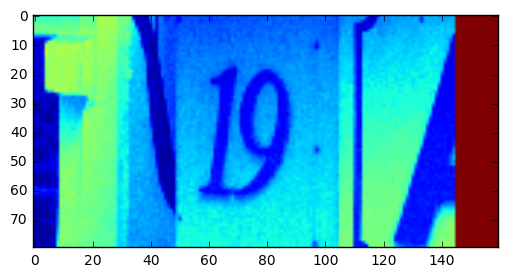

In [25]:
import matplotlib.pyplot as plt
%matplotlib inline
#Frist of all I convert the digitStruct_train.mat into csv format.
#Then I read digitstruct data from the csv file
csv_reader = csv.reader(open('digitStruct_train.csv'))
#In this example I just read 1 row of data
data = csv_reader.next()
print ("row of data:",data)
#then read corresponding image
#next is to read and procrss the image
img = Image.open("train/" + data[0])
#resize image, image too small would make it too hard to distuiguish number from image
img = img.resize((160,80))
#get grey scale pixil
pdata = img.getdata()
picture = []
for pixil in pdata:
    Gray = (pixil[0] + pixil[1] + pixil[2])/3
    picture.append(Gray)
picture = np.asarray(picture)
picture = picture.reshape(80,160)
plt.imshow(picture)

----
## Step 2: Train a Model on a Realistic Dataset
Once you have settled on a good architecture, you can train your model on real data. In particular, the [Street View House Numbers (SVHN)](http://ufldl.stanford.edu/housenumbers/) dataset is a good large-scale dataset collected from house numbers in Google Street View. Training on this more challenging dataset, where the digits are not neatly lined-up and have various skews, fonts and colors, likely means you have to do some hyperparameter exploration to perform well.

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [80]:
# generate trainning dataset, labels
def chunks(l, n):
    n = max(1, n)
    return (l[i:i+n] for i in xrange(0, len(l), n))
csv_reader = csv.reader(open('digitStruct_train.csv'))
train_labels = []
train_dataset = []
train_local = []
data = {}
num = 0
for temp in csv_reader:
#    temp = csv_reader.next()
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp
    num = num + 1


image_files = os.listdir("train")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
for key in image_files:
    temp = data[key]
    label = []
    loc = {}
    loc['up'] = []
    loc['down'] = []
    loc['left'] = []
    loc['right'] = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
        loc['left'].append(int(c[2]))
        loc['up'].append(int (c[3]))
        loc['right'].append(int(c[2]) + int(c[4]))
        loc['down'].append(int(c[3]) + int(c[5]))
    
    for i in range(temp.count(key),5):
        label.append(0)
    if(len(label)!=6):
        continue
    loc = min(loc['left']),min(loc['up']),max(loc['right']),max(loc['down'])
    train_local.append(loc)
    train_labels.append(label)
    img = Image.open("train/" + key)
    img = img.crop(loc)
    img = img.resize((64,32))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    train_dataset.append(sdata)


        

In [81]:
# generate testing dataset, labels
csv_reader = csv.reader(open('digitStruct_test.csv'))
test_labels = []
test_dataset =[]
test_local = []
data = {}
num = 0
for temp in csv_reader:
#    temp = csv_reader.next()
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp


#print (len(data.keys()),"length",num)
image_files = os.listdir("test")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
for key in image_files:
    temp = data[key]
    label = []
    loc = {}
    loc['up'] = []
    loc['down'] = []
    loc['left'] = []
    loc['right'] = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
        loc['left'].append(int(c[2]))
        loc['up'].append(int (c[3]))
        loc['right'].append(int(c[2]) + int(c[4]))
        loc['down'].append(int(c[3]) + int(c[5]))
    
    for i in range(temp.count(key),5):
        label.append(0)
    loc = min(loc['left']),min(loc['up']),max(loc['right']),max(loc['down'])
    test_local.append(loc)
    test_labels.append(label)
    img = Image.open("test/" + key)
    img = img.crop(loc)
    img = img.resize((64,32))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    test_dataset.append(sdata)

In [82]:
train_dataset = np.asarray(train_dataset)
train_labels = np.asarray(train_labels)
train_local = np.asarray(train_local)
test_local = np.asarray(test_local)
test_dataset = np.asarray(test_dataset)
test_labels = np.asarray(test_labels)
valid_dataset = test_dataset[:3000]
valid_labels = test_labels[:3000]
valid_local = test_local[:3000]
print (np.shape(valid_dataset),np.shape(valid_labels))
test_dataset = test_dataset[3000:]
test_labels = test_labels[3000:]
test_local = test_local[3000:]

(3000, 2048) (3000, 6)


In [85]:
def da():
    print('Training set', train_dataset.shape, train_labels.shape)
    print('Test set', test_dataset.shape, test_labels.shape)
    print('Validation Set',valid_dataset.shape,valid_labels.shape)
da()
valid_dataset = valid_dataset.reshape(3000,64,32,1)
test_dataset = test_dataset.reshape(10068,64,32,1)
train_dataset = train_dataset.reshape(33401,64,32,1)
valid_dataset = valid_dataset.astype(np.float32)
test_dataset = test_dataset.astype(np.float32)

Training set (33401, 64, 32, 1) (33401, 6)
Test set (10068, 64, 32, 1) (10068, 6)
Validation Set (3000, 64, 32, 1) (3000, 6)


In [519]:
pickle_file = 'digit_32x32.pickle'

with open(pickle_file, 'rb') as f:
    save = pickle.load(f)
    train_dataset = save['train_dataset']
    train_labels = save['train_labels']
    valid_dataset = save['valid_dataset']
    valid_labels = save['valid_labels']
    test_dataset = save['test_dataset']
    test_labels = save['test_labels']
    del save  # hint to help gc free up memory
    print('Training set', train_dataset.shape, train_labels.shape)
    print('Validation set', valid_dataset.shape, valid_labels.shape)
    print('Test set', test_dataset.shape, test_labels.shape)

Training set (33401, 32, 32, 1) (33401, 6)
Validation set (3000, 32, 32, 1) (3000, 6)
Test set (10068, 32, 32, 1) (10068, 6)


In [520]:
def onehot(label):
    result = []
    for l in label:
        temp = []
        for i in range(1,11):
            if(i == int(l)):
                temp.append(1)
            else:
                temp.append(0)
        if 1 in temp:
            temp.append(0)
        else:
            temp.append(1)
        result = result + temp
    return result
def onehotall(labels):
    result = []
    for label in labels:
        result.append(onehot(label[1:]))
    return result
# test = onehotall(valid_labels)
valid_labels  = onehotall(valid_labels)
test_labels  = onehotall(test_labels)
train_labels  = onehotall(train_labels)
train_labels = np.asarray(train_labels)
test_labels = np.asarray(test_labels)
valid_labels = np.asarray(valid_labels)
print (valid_labels.shape,test_labels.shape,train_labels.shape)

(3000, 55) (10068, 55) (33401, 55)


In [528]:
batch_size = 64
patch_size = 5 # conv kernel size
depth1 = 16
depth2 = 32
depth3 = 64
num_hidden = 1024

image_size = 32
num_labels = 11 
num_channels = 1 # grayscale

graph = tf.Graph()

with graph.as_default():

    def get_weight_variable(name, shape):
        return tf.get_variable(name, shape=shape, initializer=tf.contrib.layers.xavier_initializer_conv2d())

    def bias_variable(shape):
        initial = tf.constant(1.0, shape = shape)
        return tf.Variable(initial)
    
    def conv2d(data, weight):
        # strides [1, x_movement, y_movement, 1]
        return tf.nn.conv2d(data, weight, strides = [1, 1, 1, 1], padding = 'SAME')

    def max_pooling(data):
        return tf.nn.max_pool(data, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'SAME')
    
    def get_label_wb(weight_name):
        weights = tf.get_variable(weight_name, shape=[num_hidden, 11],\
                                  initializer=tf.contrib.layers.xavier_initializer())
        biases = tf.Variable(tf.constant(1.0, shape=[11]))
        return weights, biases 
    
    # Input data.
    tf_train_dataset = tf.placeholder(
    tf.float32, shape=(batch_size, image_size,image_size, num_channels))
    tf_train_labels = tf.placeholder(tf.int32, shape=(batch_size, 55))
    tf_valid_dataset = tf.constant(valid_dataset)
    tf_test_dataset = tf.constant(test_dataset)
    beta_regul = tf.placeholder(tf.float32)
    
    
    # Varibles
    # conv1 layer 1
    layer1_weights = get_weight_variable('CNN_W1', [patch_size, patch_size, num_channels, depth1])
    layer1_biases = bias_variable([depth1]) # 16
    # conv2 layer 2
    layer2_weights = get_weight_variable('CNN_W2', [patch_size, patch_size, depth1, depth2])
    layer2_biases = bias_variable([depth2]) # 32
    # conv3 layer 3
    layer3_weights = get_weight_variable('CNN_W3', [patch_size, patch_size, depth2, depth3])
    layer3_biases = bias_variable([depth3]) # 64
    
    # func1 layer 4
    layer4_weights = get_weight_variable('FC_W1',[4 * 4 * depth3, num_hidden])
    layer4_biases = bias_variable([num_hidden])
    
    # locally connected layers
    s1_w, s1_b = get_label_wb('S1_W')
    s2_w, s2_b = get_label_wb('S2_W')
    s3_w, s3_b = get_label_wb('S3_W')
    s4_w, s4_b = get_label_wb('S4_W')
    s5_w, s5_b = get_label_wb('S5_W')
    
    sw = [s1_w, s2_w, s3_w, s4_w, s5_w]
    
    global_step = tf.Variable(0)  # count the number of steps taken.
    
    def model(dataset, keep_prob, keep_prob2):
        # conv1 layer 1
        hidden1 = tf.nn.relu(conv2d(dataset, layer1_weights) + layer1_biases) # 32 * 32 * depth1
        hidden1 = tf.nn.local_response_normalization(hidden1)
        pool1 = max_pooling(hidden1) # 16 * 16 * depth1
        
        # conv2 layer 2
        hidden2 = tf.nn.relu(conv2d(pool1, layer2_weights) + layer2_biases) # 16 * 16 * depth2
        hidden2 = tf.nn.local_response_normalization(hidden2)
        pool2 = max_pooling(hidden2) # 8 * 8 * depth2
        
        pool2 = tf.nn.dropout(pool2, keep_prob2)
        
        # conv3 layer 3
        hidden3 = tf.nn.relu(conv2d(pool2, layer3_weights) + layer3_biases) # 8 * 8 * depth3
        hidden3 = tf.nn.local_response_normalization(hidden3)
        pool3 = max_pooling(hidden3) # 4 * 4 * depth3
        
        pool3 = tf.nn.dropout(pool3, keep_prob2)
        
        shape = pool3.get_shape().as_list()
        pool3_flat = tf.reshape(pool3, [shape[0], shape[1] * shape[2] * shape[3]]) # 1024
        
        # func1 layer 4
        hidden4 = tf.nn.relu(tf.matmul(pool3_flat, layer4_weights) + layer4_biases)
        hidden4_drop = tf.nn.dropout(hidden4, keep_prob)

        logits_1 = tf.matmul(hidden4_drop, s1_w) + s1_b
        logits_2 = tf.matmul(hidden4_drop, s2_w) + s2_b
        logits_3 = tf.matmul(hidden4_drop, s3_w) + s3_b
        logits_4 = tf.matmul(hidden4_drop, s4_w) + s4_b
        logits_5 = tf.matmul(hidden4_drop, s5_w) + s5_b
        
        return [logits_1, logits_2, logits_3, logits_4, logits_5]
    
    # Training computation.
    logits = model(tf_train_dataset, 0.5, 0.8)
    
    loss_per_digit = [tf.reduce_mean(
                        tf.nn.softmax_cross_entropy_with_logits(
                            logits[i],
                            tf_train_labels[:,i*11:(i+1)*11]
                        )) 
                       for i in range(5)]
    
    loss = tf.add_n(loss_per_digit)

    # Optimizer.
    learning_rate = tf.train.exponential_decay(0.001, global_step, 1000, 0.90, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(loss, global_step=global_step)
    
    def prediction_softmax(dataset):
        prediction = tf.pack([
            tf.nn.softmax(model(dataset, 1.0, 1.0)[0]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[1]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[2]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[3]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[4])])
        return prediction
    
    # Predictions for the training, validation, and test data.
    train_prediction = prediction_softmax(tf_train_dataset)
    valid_prediction = prediction_softmax(tf_valid_dataset)             
    test_prediction = prediction_softmax(tf_test_dataset)
    tf_real = tf.constant(real_dataset)
    real_prediction = prediction_softmax(tf_real)
    
    # Save Model 
    saver = tf.train.Saver()

In [522]:
num_steps = 20001
def ac(predictions, labels): 
  return (100.0 * np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))
          / predictions.shape[0])

def compare(pre,lab):
    for i in range(0,5):
        if(np.argmax(lab[i*11:11*(i+1)], 0) == 10):
            return 1.0
        if(np.argmax(pre[i,:], 0) != np.argmax(lab[i*11:11*(i+1)], 0)):
            return 0
    return 1.0

def caccuracy(predictions, labels):
    temp = 0
    for i in range(0,predictions.shape[1]):
        temp = temp + compare(predictions[:,i,:],labels[i,:])
    return temp/float(predictions.shape[1]) *100

def accuracy(predictions, labels):
    temp = 0
    for i in range(0,5):
        temp = temp + ac(predictions[i,:,:],labels[:,i*11:(i+1)*11])
    return temp/5

with tf.Session(graph=graph) as session:
  tf.initialize_all_variables().run()
  print("Initialized")
  for step in range(num_steps):
    # Pick an offset within the training data, which has been randomized.
    # Note: we could use better randomization across epochs.
    offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
    # Generate a minibatch.
    batch_data = train_dataset[offset:(offset + batch_size), :]
    batch_labels = train_labels[offset:(offset + batch_size), :]
    # Prepare a dictionary telling the session where to feed the minibatch.
    # The key of the dictionary is the placeholder node of the graph to be fed,
    # and the value is the numpy array to feed to it.
    feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
    _, l, predictions = session.run(
      [optimizer, loss, train_prediction], feed_dict=feed_dict)
    if (step % 1000 == 0):
      print("Minibatch loss at step %d: %f" % (step, l))
      print("Minibatch word accuracy: %.1f%%" % caccuracy(predictions, batch_labels))
      print("Minibatch digit accuracy: %.1f%%" % accuracy(predictions, batch_labels))
      print("Validation word accuracy: %.1f%%" % caccuracy(
         valid_prediction.eval(), valid_labels))
      print("Validation digit accuracy: %.1f%%"% accuracy(
         valid_prediction.eval(), valid_labels))
  save_path = saver.save(session, "model")
  print("Test word accuracy: %.1f%%" % caccuracy(test_prediction.eval(), test_labels))
  print("Test digit accuracy: %.1f%%" % accuracy(test_prediction.eval(), test_labels))

Instructions for updating:
Use `tf.global_variables_initializer` instead.


Instructions for updating:
Use `tf.global_variables_initializer` instead.


Initialized
Minibatch loss at step 0: 18.516613
Minibatch word accuracy: 0.0%
Minibatch digit accuracy: 2.2%
Validation word accuracy: 3.1%
Validation digit accuracy: 64.0%
Minibatch loss at step 1000: 3.394288
Minibatch word accuracy: 43.8%
Minibatch digit accuracy: 81.9%
Validation word accuracy: 46.7%
Validation digit accuracy: 84.3%
Minibatch loss at step 2000: 2.594536
Minibatch word accuracy: 56.2%
Minibatch digit accuracy: 85.9%
Validation word accuracy: 66.1%
Validation digit accuracy: 90.6%
Minibatch loss at step 3000: 1.628638
Minibatch word accuracy: 75.0%
Minibatch digit accuracy: 93.4%
Validation word accuracy: 72.1%
Validation digit accuracy: 92.0%
Minibatch loss at step 4000: 1.159186
Minibatch word accuracy: 78.1%
Minibatch digit accuracy: 94.7%
Validation word accuracy: 75.3%
Validation digit accuracy: 93.0%
Minibatch loss at step 5000: 1.738738
Minibatch word accuracy: 76.6%
Minibatch digit accuracy: 93.1%
Validation word accuracy: 75.8%
Validation digit accuracy: 93.

### Question 4
_Describe how you set up the training and testing data for your model. How does the model perform on a realistic dataset?_

**Answer:**

For both training and testing data, there are dataset part, which contains image pixil data, and label part, which contains information telling us what digit the image have.

Frist of all I read data from digitstruct file. I convert the digitStruct_train.mat into csv format, then read digitstruct data from the csv file. Each row in the digitstruct file represent a single digit, so I created a dict, and store the digit in the same image to the same key.

Then I start to set up training dataset and training label. For each image, I read the image from its filename, convert it into 160x80 size(around 75 percentile of all image size),convert the RGB pixil into grey scale(average the 3),then store them into a 160x80 length array. For all the training data, I have 33401 image of length 160x80, which consist of my training dataset. For the label, I assume there are at most 5 digit in the same image, so I first read the label in each image, then fill 0 to make each label size 5. For each size 5 labe, I then 1-hot encoding them, convert each number of label into 11 digit, with 1 in the right place, and 0 in other place. So I have 33401 label with size 55(5x11). For the testing data, the method is basically the same, except that the total size of test dataset and label is 13068. For these test data, I split it into 2 parts, with 3000 as validation data, and remaining as test data.

As for the performance, I actually could not finish training using this complex model with such a big dataset. The training step is very slow, and run out of my memory, make it crush on the half way.

In [79]:
#size of image in training dataset
image_files = os.listdir("train")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
data = {}
data['x'] = []
data['y'] = []
for ig in image_files:
    img = Image.open("train/" + ig)
    size = img.size
    data['x'].append(size[0])
    data['y'].append(size[1])
df = pd.DataFrame(data)
df.describe()

,x,y
count,33402.000000,33402.000000
mean,128.284983,57.213011
std,80.546218,36.179696
min,25.000000,12.000000
25%,72.000000,33.000000
50%,104.000000,47.000000
75%,158.000000,71.000000
max,876.000000,501.000000


### Question 5
_What changes did you have to make, if any, to achieve "good" results? Were there any options you explored that made the results worse?_

**Answer:**

When I fed my 33401x160x80 training data to my 6 layer model, I found that things do not work: first of all,the training speed is extremly slow, with 1 hour passed only 1000+ step work done; next, it is too space consuming, the notebook crash half way with 8G RAM macbook pro. So I realize I should reduce the image size, and simplify the model structure.

To reduce the image size, resize a big picture into small picture would sometimes make the digit in image hard to distuiguish, so I decide to using  the croped image, instead of the whole image. I use the localize information from the digitstruct to locate the area the digit occupy in the image, then crop only that area, and resize it to 32x32. So my refined training dataset size is 33401x32x32.

To simplify the model, I deleted 3 of the 1-step-same-padding convulution layer, so now it has only a 3 layer model.

There are some change made to the model made the result worse, the most often one is: inapropiate adjustment of learning rate, which would make loss become Nan very fast,thus make the model unable to learn anymore.Also, increase the input image size with the same model structure would worth both the training time and result. Other changes, such as increase/delete layer, modify layer variable size does not nessaraly make the model better or worse, from my experience. 

### Question 6
_What were your initial and final results with testing on a realistic dataset? Do you believe your model is doing a good enough job at classifying numbers correctly?_

**Answer:**

My initial attempt on realistic dataset results in the system crash due to the too much time spend on training and too much memory usuage. So I didn't obtain any result from that attempt.

My final model utilize 3-layer model, with 32x32 size input image data croped with bounding box provided in the digitstruct file, and achive around 80% accuracy on whole image identification, around 95% accuracy on single digit identification (assuming each image has 5 digit).

The best try for using original image as input(do not crop them according to bounding box) achives around 40% image accuracy and 75% digit accuracy.

80% image accuracy is not a satisfieable result, but considering the time-space-accuracy trade-off, I think my model did a good job: maybe increase input image data size or increase the complexity of my model could marginly increase the result accuracy, but the space/time consumed would significantly increase, which is not practical in my PC.

----
## Step 3: Test a Model on Newly-Captured Images

Take several pictures of numbers that you find around you (at least five), and run them through your classifier on your computer to produce example results. Alternatively (optionally), you can try using OpenCV / SimpleCV / Pygame to capture live images from a webcam and run those through your classifier.

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

5 example image


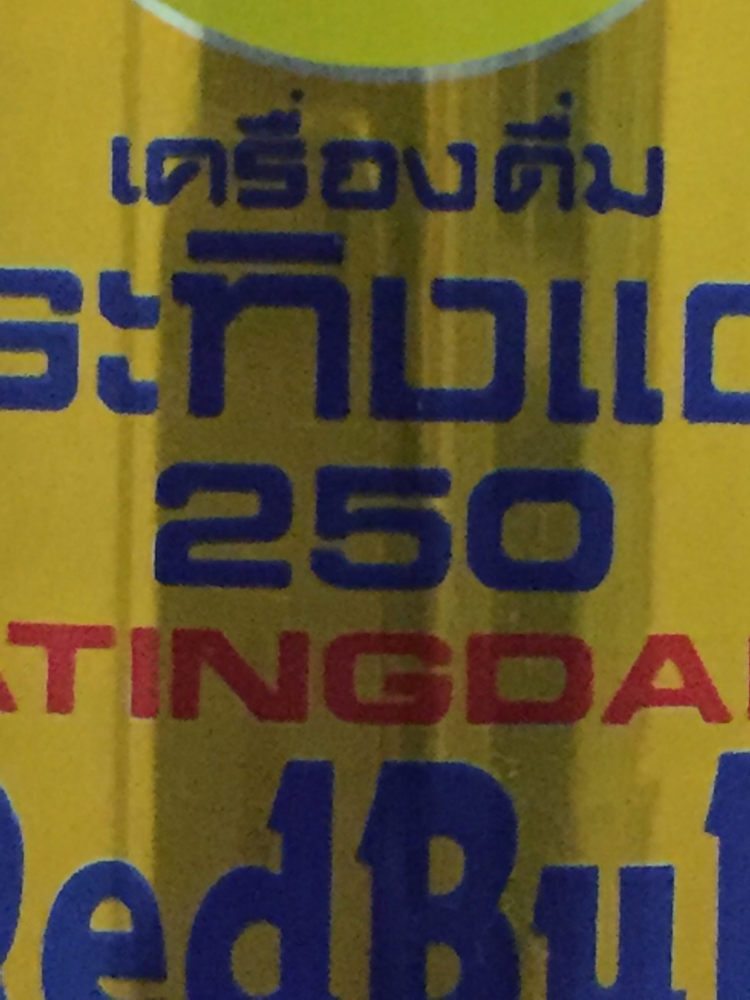

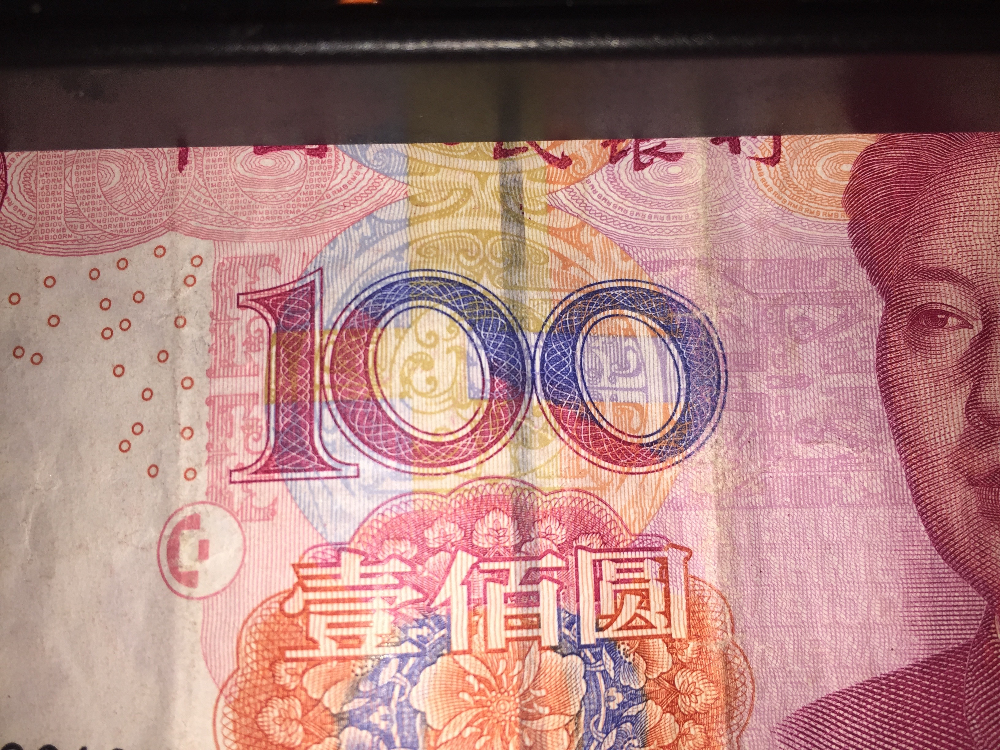

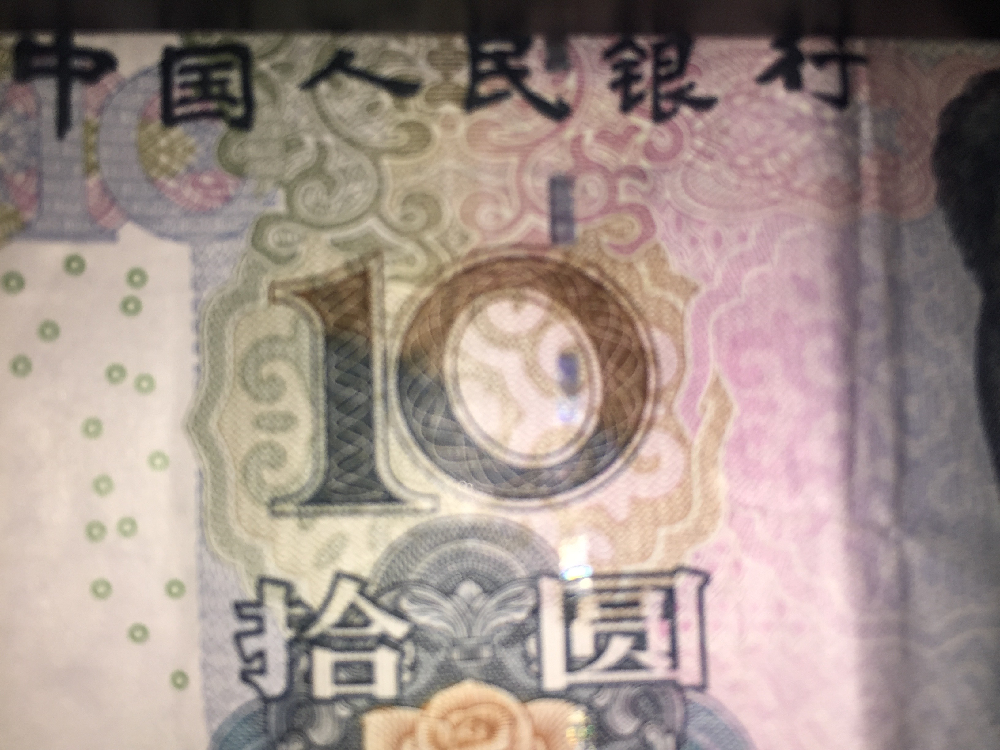

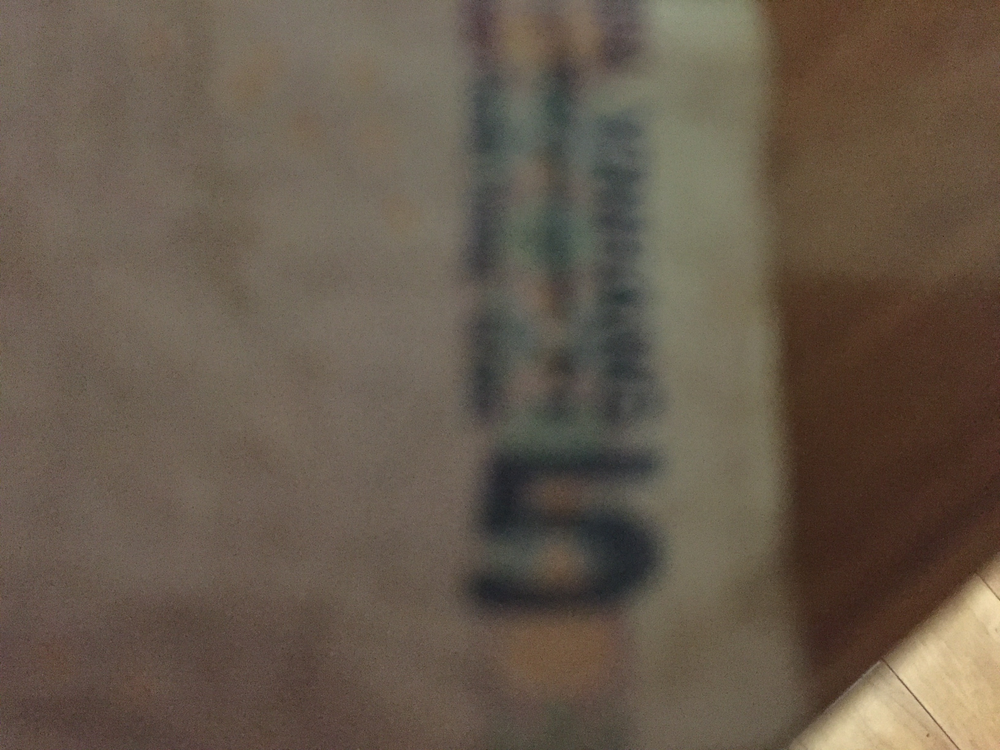

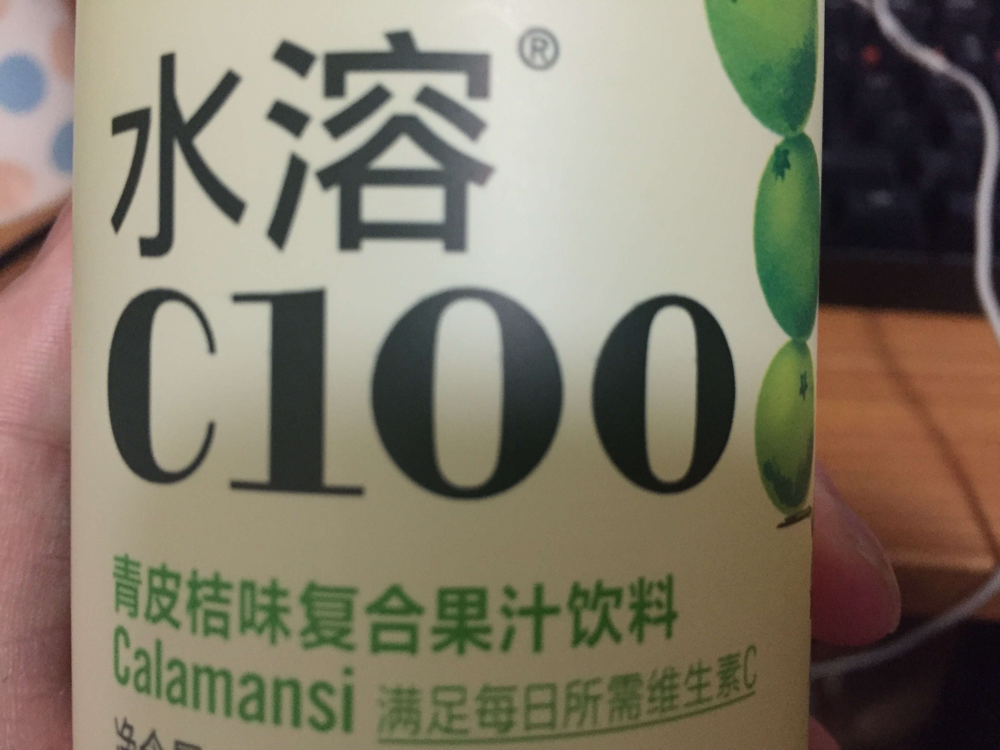

In [523]:


### Your code implementation goes here.
### Feel free to use as many code cells as needed.
from IPython.display import display ,Image
print ("5 example image")
display(Image(filename="real_1.jpg"))
display(Image(filename="real_2.jpg"))
display(Image(filename="real_3.jpg"))
display(Image(filename="real_4.jpg"))
display(Image(filename="real_5.jpg"))

In [535]:
from PIL import Image
img_files = ["real_1.jpg","real_2.jpg","real_3.jpg","real_4.jpg","real_5.jpg"]
real_dataset = []
for key in img_files:
    img = Image.open(key)
    img = img.resize((32,32))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    real_dataset.append(sdata)
real_dataset = np.array(real_dataset).astype(np.float32)
real_dataset = real_dataset.reshape(5,32,32,1)

real_1.jpg
real_2.jpg
real_3.jpg
real_4.jpg
real_5.jpg


In [529]:
sess = tf.Session(graph=graph)
new_saver = tf.train.import_meta_graph('model.meta')
new_saver.restore(sess, tf.train.latest_checkpoint('./'))
all_vars = tf.trainable_variables()
prediction = real_prediction.eval(session = sess)

Test size accuracy: 94.2%


In [534]:
label = []
print (prediction.shape)
for i in range(5):
    digit = []
    for j in prediction[:,i,:]:
        digit.append(np.argmax(j))
    label.append(digit)
print (label)        
250 100 10 5 100

(5, 5, 11)
[[0, 10, 10, 10, 10], [0, 1, 10, 10, 10], [1, 0, 10, 10, 10], [3, 10, 10, 10, 10], [1, 10, 10, 10, 10]]


### Question 7
_Choose five candidate images of numbers you took from around you and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult?_

**Answer:**

The 5 image shows above, 3 of them are from money, 2 of them from drinking bottle.

There are qualities which could make the image difficult to distuiguish:

Since the final model I use assumes croped input image,If the proportion of data area verses image size is small, the probobility to correctly classify the image would be small.

Character other than digit in the picture, such as english character, would also affect the performance of classification, since the model may incorrectly identify some character as digit.

### Question 8
_Is your model able to perform equally well on captured pictures or a live camera stream when compared to testing on the realistic dataset?_

**Answer:**

The model perform worse on captured picture.

With first image, correct label is 250, but predicted 1.

With second image, correct label is 100, but predicted 12.

With first image, correct label is 10, but predicted 21.

With first image, correct label is 5, but predicted 3.

With first image, correct label is 100, but predicted 1.

overall image accuracy is 0, digit accuracy is 68% ( lots of 'null digit' correctly predicted)

### Optional: Question 9
_If necessary, provide documentation for how an interface was built for your model to load and classify newly-acquired images._

**Answer:** Leave blank if you did not complete this part.

----
### Step 4: Explore an Improvement for a Model

There are many things you can do once you have the basic classifier in place. One example would be to also localize where the numbers are on the image. The SVHN dataset provides bounding boxes that you can tune to train a localizer. Train a regression loss to the coordinates of the bounding box, and then test it. 

### Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [417]:
# train_size['x_ratio'] = train_size['x'] / 48 
# train_size['y_ratio'] = train_size['y'] / 24 
# train_size.head()
# train_size[0] = train_size[0] / train_size['x_ratio']
# train_size[2] = train_size[2] / train_size['x_ratio']
# train_size[1] = train_size[1] / train_size['y_ratio']
# train_size[3] = train_size[3] / train_size['y_ratio']
# train_label = train_size[[0,1,2,3]].astype(np.int32).values
# print (train_label.shape,test_label.shape,train_dataset.shape)
# valid_label = train_label[:3000]
# train_label = train_label[3000:]
def onehotbit(num,ran):
    data = []
    for i in range(ran):
        if(num!=i):
            data.append(0)
        else:
            data.append(1)
    return data
def onehotlabel(label):
    data = []
    data = data + onehotbit(label[0],49)
    data = data + onehotbit(label[1],49)
    data = data + onehotbit(label[2],49)
    data = data + onehotbit(label[3],49)
    return data
def onehot(labels):
    data = []
    for label in labels:
        data.append(onehotlabel(label))
    return np.array(data)
train_labels = onehot(train_label)
valid_labels = onehot(valid_label)
test_labels = onehot(test_label)
da()

Training set (26056, 48, 24, 1) (26056, 196)
Test set (6695, 48, 24, 1) (6695, 196)
Validation Set (3000, 48, 24, 1) (3000, 196)


In [383]:
# test_size['x_ratio'] = test_size['x'] / 48 
# test_size['y_ratio'] = test_size['y'] / 24 
# test_size.head()
# test_size[0] = test_size[0] / test_size['x_ratio']
# test_size[2] = test_size[2] / test_size['x_ratio']
# test_size[1] = test_size[1] / test_size['y_ratio']
# test_size[3] = test_size[3] / test_size['y_ratio']
# test_label = test_size[[0,1,2,3]].astype(np.int32).values

(6695, 4)

In [389]:
df = pd.DataFrame(train_local)
df['e_size'] = (df[3] - df[1]) * (df[2] - df[0]) 
di = df[4]
image_files = os.listdir("train")
image_files.remove('digitStruct.mat')
image_files.remove('see_bboxes.m')
x = []
y = []
for ig in di:
    img = Image.open("train/" + ig)
    size = img.size
    x.append(size[0])
    y.append(size[1])
df['x'] = x
df['y'] = y
df['size'] = df['x'] * df['y']
df['ratio'] = df['e_size']/df['size']
df.head()
df.ratio.describe()
ratio = df.ratio
index = ratio[ratio<0.1].index
train_size = df.drop(index)

In [326]:
# generate trainning dataset, labels
csv_reader = csv.reader(open('digitStruct_train.csv'))
train_labels = []
train_dataset = []
data = {}
num = 0
for temp in csv_reader:
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp
    num = num + 1


#print (len(data.keys()),"length",num)
for key in test[4]:
    temp = data[key]
    label = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
    for i in range(temp.count(key),5):
        label.append(0)
    if(len(label)!=6):
        continue
    train_labels.append(label)
    img = Image.open("train/" + key)
    img = img.resize((48,24))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    train_dataset.append(sdata)

        

In [320]:
# generate trainning dataset, labels
csv_reader = csv.reader(open('digitStruct_test.csv'))
test_labels = []
test_dataset = []
data = {}
num = 0
for temp in csv_reader:
    data.setdefault(temp[0],[])
    data[temp[0]] = data[temp[0]]+temp

#print (len(data.keys()),"length",num)
for key in test[4]:
    temp = data[key]
    label = []
    label.append(temp.count(key))
    chunk = chunks(temp,6)
    for c in chunk:
        label.append(c[1])
    for i in range(temp.count(key),5):
        label.append(0)
    if(len(label)!=6):
        continue
    test_labels.append(label)
    img = Image.open("test/" + key)
    img = img.resize((48,24))
    pdata = img.getdata()
    sdata = []
    for pixil in pdata:
        Gray = (pixil[0] + pixil[1] + pixil[2])/3
        sdata.append(Gray)
    test_dataset.append(sdata)

        

In [327]:
# df = pd.DataFrame(test_local)
# df['e_size'] = (df[3] - df[1]) * (df[2] - df[0]) 
# di = df[4]
# image_files = os.listdir("test")
# image_files.remove('digitStruct.mat')
# image_files.remove('see_bboxes.m')
# x = []
# y = []
# for ig in di:
#     img = Image.open("test/" + ig)
#     size = img.size
#     x.append(size[0])
#     y.append(size[1])
# df['x'] = x
# df['y'] = y
# df['size'] = df['x'] * df['y']
# df['ratio'] = df['e_size']/df['size']
# df.head()
# df.ratio.describe()
# ratio = df.ratio
# index = ratio[ratio<0.1].index
train_dataset = np.asarray(train_dataset)
train_labels = np.asarray(train_labels)
test_dataset = np.asarray(test_dataset)
test_labels = np.asarray(test_labels)
da()

Training set (29056, 1152) (29056, 6)
Test set (6695, 1152) (6695, 6)
Validation Set (3000, 48, 24, 1) (3000, 594)


In [330]:
# valid_dataset = train_dataset[:3000]
# valid_labels = train_labels[:3000]
# train_dataset = train_dataset[3000:]
# train_labels = train_labels[3000:]
da()
valid_dataset = valid_dataset.reshape(3000,48,24,1)
test_dataset = test_dataset.reshape(6695,48,24,1)
train_dataset = train_dataset.reshape(26056,48,24,1)
valid_labels  = onehotall(valid_labels)
test_labels  = onehotall(test_labels)
train_labels  = onehotall(train_labels)
train_labels = np.asarray(train_labels)
test_labels = np.asarray(test_labels)
valid_labels = np.asarray(valid_labels)
da()

Training set (26056, 1152) (26056, 6)
Test set (6695, 48, 24, 1) (6695, 6)
Validation Set (3000, 48, 24, 1) (3000, 6)
Training set (26056, 48, 24, 1) (26056, 55)
Test set (6695, 48, 24, 1) (6695, 55)
Validation Set (3000, 48, 24, 1) (3000, 55)


In [331]:
valid_dataset = valid_dataset.astype(np.float32)
test_dataset = test_dataset.astype(np.float32)
train_dataset= train_dataset.astype(np.float32)
da()

Training set (26056, 48, 24, 1) (26056, 55)
Test set (6695, 48, 24, 1) (6695, 55)
Validation Set (3000, 48, 24, 1) (3000, 55)


In [489]:


### Your code implementation goes here.
### Feel free to use as many code cells as needed.
batch_size = 64
patch_size = 5 # conv kernel size
depth1 = 16
depth2 = 32
depth3 = 64
num_hidden = 1024

image_size = 24
num_labels = 11 
num_channels = 1 # grayscale

graph = tf.Graph()

with graph.as_default():

    def get_weight_variable(name, shape):
        return tf.get_variable(name, shape=shape, initializer=tf.contrib.layers.xavier_initializer_conv2d())

    def bias_variable(shape):
        initial = tf.constant(1.0, shape = shape)
        return tf.Variable(initial)
    
    def conv2d(data, weight):
        # strides [1, x_movement, y_movement, 1]
        return tf.nn.conv2d(data, weight, strides = [1, 1, 1, 1], padding = 'SAME')

    def max_pooling(data):
        return tf.nn.max_pool(data, ksize = [1, 2, 2, 1], strides = [1, 2, 2, 1], padding = 'SAME')
    
    def get_label_wb(weight_name):
        weights = tf.get_variable(weight_name, shape=[num_hidden, 49],\
                                  initializer=tf.contrib.layers.xavier_initializer())
        biases = tf.Variable(tf.constant(1.0, shape=[49]))
        return weights, biases 
    
    # Input data.
    tf_train_dataset = tf.placeholder(
    tf.float32, shape=(batch_size, image_size*2,image_size, num_channels))
    tf_train_labels = tf.placeholder(tf.int32, shape=(batch_size, 196))
    tf_valid_dataset = tf.constant(valid_dataset)
    tf_test_dataset = tf.constant(test_dataset)
    beta_regul = tf.placeholder(tf.float32)
    
    
    # Varibles
    # conv1 layer 1
    layer1_weights = get_weight_variable('CNN_W1', [patch_size, patch_size, num_channels, depth1])
    layer1_biases = bias_variable([depth1]) # 16
    # conv2 layer 2
    layer2_weights = get_weight_variable('CNN_W2', [patch_size, patch_size, depth1, depth2])
    layer2_biases = bias_variable([depth2]) # 32
    # conv3 layer 3
    layer3_weights = get_weight_variable('CNN_W3', [patch_size, patch_size, depth2, depth3])
    layer3_biases = bias_variable([depth3]) # 64
    
    # func1 layer 4
    layer4_weights = get_weight_variable('FC_W1',[3 * 6 * depth3, num_hidden])
    layer4_biases = bias_variable([num_hidden])
    
    # locally connected layers
    s1_w, s1_b = get_label_wb('S1_W')
    s2_w, s2_b = get_label_wb('S2_W')
    s3_w, s3_b = get_label_wb('S3_W')
    s4_w, s4_b = get_label_wb('S4_W')
    
    sw = [s1_w, s2_w, s3_w, s4_w, s5_w]
    
    global_step = tf.Variable(0)  # count the number of steps taken.
    
    def model(dataset, keep_prob, keep_prob2):
        # conv1 layer 1
        hidden1 = tf.nn.relu(conv2d(dataset, layer1_weights) + layer1_biases) # 32 * 32 * depth1
        hidden1 = tf.nn.local_response_normalization(hidden1)
        pool1 = max_pooling(hidden1) # 16 * 16 * depth1
        
        # conv2 layer 2
        hidden2 = tf.nn.relu(conv2d(pool1, layer2_weights) + layer2_biases) # 16 * 16 * depth2
        hidden2 = tf.nn.local_response_normalization(hidden2)
        pool2 = max_pooling(hidden2) # 8 * 8 * depth2
        
        pool2 = tf.nn.dropout(pool2, keep_prob2)
        
        # conv3 layer 3
        hidden3 = tf.nn.relu(conv2d(pool2, layer3_weights) + layer3_biases) # 8 * 8 * depth3
        hidden3 = tf.nn.local_response_normalization(hidden3)
        pool3 = max_pooling(hidden3) # 4 * 4 * depth3
        
        pool3 = tf.nn.dropout(pool3, keep_prob2)
        
        shape = pool3.get_shape().as_list()
        pool3_flat = tf.reshape(pool3, [shape[0], shape[1] * shape[2] * shape[3]]) # 1024
        
        # func1 layer 4
        hidden4 = tf.nn.relu(tf.matmul(pool3_flat, layer4_weights) + layer4_biases)
        hidden4_drop = tf.nn.dropout(hidden4, keep_prob)

        logits_1 = tf.matmul(hidden4_drop, s1_w) + s1_b
        logits_2 = tf.matmul(hidden4_drop, s2_w) + s2_b
        logits_3 = tf.matmul(hidden4_drop, s3_w) + s3_b
        logits_4 = tf.matmul(hidden4_drop, s4_w) + s4_b
        
        return [logits_1, logits_2, logits_3, logits_4]
    
    # Training computation.
    logits = model(tf_train_dataset, 0.5, 0.8)
    
    loss_per_digit = [tf.reduce_mean(
                        tf.nn.softmax_cross_entropy_with_logits(
                            logits[i],
                            tf_train_labels[:,i*49:(i+1)*49]
                        )) 
                       for i in range(4)]
    
    loss = tf.add_n(loss_per_digit)

    # Optimizer.
    learning_rate = tf.train.exponential_decay(0.001, global_step, 1000, 0.90, staircase=True)
    optimizer = tf.train.AdamOptimizer(learning_rate).minimize(loss, global_step=global_step)
    
    def prediction_softmax(dataset):
        prediction = tf.pack([
            tf.nn.softmax(model(dataset, 1.0, 1.0)[0]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[1]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[2]),
            tf.nn.softmax(model(dataset, 1.0, 1.0)[3])])
        return prediction
    
    # Predictions for the training, validation, and test data.
    train_prediction = prediction_softmax(tf_train_dataset)
    valid_prediction = prediction_softmax(tf_valid_dataset)             
    test_prediction = prediction_softmax(tf_test_dataset)
    sdata = sdata.astype(np.float32)
    tf_real = tf.constant(sdata)
    real = prediction_softmax(tf_real)
    print (real)
    # Save Model 
    saver = tf.train.Saver()


Tensor("pack_3:0", shape=(4, 1, 49), dtype=float32)


In [439]:
def common(a,b):
    if(a[1] < b[0] or a[0] > b[1]):
        return 0.0
    else:
        return min(a[1],b[1]) - max(a[0],b[0])
common((10,20),(5,17))

7

In [447]:
num_steps = 20001
def ac(predictions, labels): 
    pre = []
    label = []
    for things in predictions:
        pre.append(np.argmax(things))
    if(pre[0]>pre[2] or pre[1] > pre[3]):
        return 0.0
    l = chunks(labels,49)
    for i in range(4):  
        label.append(np.argmax(l.next()))
    l = common((pre[0],pre[2]),(label[0],label[2]))
    l = float(l)
    w = common((pre[1],pre[3]),(label[1],label[3]))
    ratio = w*l / (label[3]-label[1])/(label[2] - label[0])
    return ratio
    

def accuracy(predictions, labels):
    temp = 0
    for i in range(predictions.shape[1]):
        temp = temp + ac(predictions[:,i,:],labels[i])
    return temp/predictions.shape[1] * 100

with tf.Session(graph=graph) as session:
  tf.initialize_all_variables().run()
  print("Initialized")
  for step in range(num_steps):
    # Pick an offset within the training data, which has been randomized.
    # Note: we could use better randomization across epochs.
    offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
    # Generate a minibatch.
    batch_data = train_dataset[offset:(offset + batch_size), :]
    batch_labels = train_labels[offset:(offset + batch_size), :]
    # Prepare a dictionary telling the session where to feed the minibatch.
    # The key of the dictionary is the placeholder node of the graph to be fed,
    # and the value is the numpy array to feed to it.
    feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
    _, l, predictions = session.run(
      [optimizer, loss, train_prediction], feed_dict=feed_dict)
    if (step % 1000 == 0):
      print("Minibatch loss at step %d: %f" % (step, l))
      print("Minibatch size accuracy: %.1f%%" % accuracy(predictions, batch_labels))
      print("Validation size accuracy: %.1f%%"% accuracy(
         valid_prediction.eval(), valid_labels))
  save_path = saver.save(session, "model.ckpt")
  print("Test size accuracy: %.1f%%" % accuracy(test_prediction.eval(), test_labels))

Instructions for updating:
Use `tf.global_variables_initializer` instead.


Instructions for updating:
Use `tf.global_variables_initializer` instead.


Initialized
Minibatch loss at step 0: 23.770895
Minibatch size accuracy: 0.0%
Validation size accuracy: 81.7%
Minibatch loss at step 1000: 8.646923
Minibatch size accuracy: 85.2%
Validation size accuracy: 80.8%
Minibatch loss at step 2000: 7.885668
Minibatch size accuracy: 88.5%
Validation size accuracy: 88.5%
Minibatch loss at step 3000: 7.151554
Minibatch size accuracy: 87.5%
Validation size accuracy: 87.1%
Minibatch loss at step 4000: 7.108659
Minibatch size accuracy: 88.1%
Validation size accuracy: 85.9%
Minibatch loss at step 5000: 6.833991
Minibatch size accuracy: 91.0%
Validation size accuracy: 88.2%
Minibatch loss at step 6000: 6.642840
Minibatch size accuracy: 86.0%
Validation size accuracy: 85.3%
Minibatch loss at step 7000: 6.238800
Minibatch size accuracy: 88.6%
Validation size accuracy: 85.3%
Minibatch loss at step 8000: 6.661751
Minibatch size accuracy: 86.7%
Validation size accuracy: 87.8%
Minibatch loss at step 9000: 6.031120
Minibatch size accuracy: 90.3%
Validation si

In [500]:
sess = tf.Session(graph=graph)
new_saver = tf.train.import_meta_graph('model.ckpt.meta')
new_saver.restore(sess, tf.train.latest_checkpoint('./'))
all_vars = tf.trainable_variables()
print("Test size accuracy: %.1f%%" % accuracy(test_prediction.eval(session=sess), test_labels))
prediction = real.eval(session = sess)

Test size accuracy: 85.0%


original image:


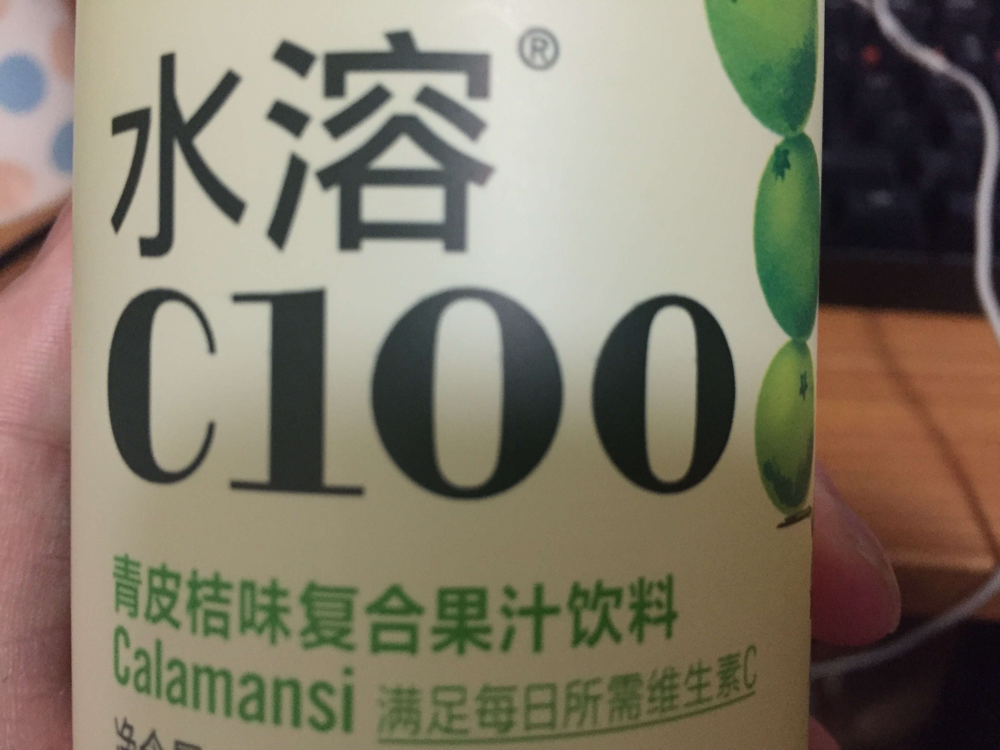

predicted box: [12, 3, 37, 17]
resized image


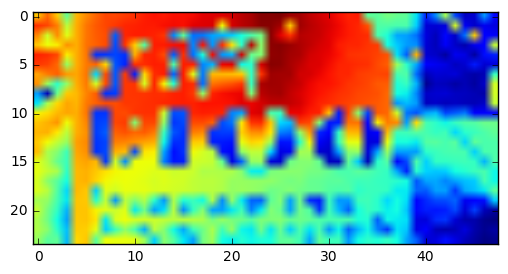

In [518]:
from IPython.display import display ,Image
print ("original image:")
display(im(filename="test.jpg"))
pre = []
for things in prediction:
    pre.append(np.argmax(things))
print ("predicted box:",pre)
print ("resized image")
plt.imshow(sdata)

### Question 10
_How well does your model localize numbers on the testing set from the realistic dataset? Do your classification results change at all with localization included?_

**Answer:**

I finally achive 85% accuracy on predicting the area on test dataset, which is a good result. The metric I use on this model is average accurate ratio of accuracy, the single accuracy ratio is calculated with formula:

overlap(predicted_area,data_area)/data_area.

and I just average this accuracy number on all the dataset.

As illustrated on step 2, with hardware constrain, I could only achive around 40% image accuracy,75% digit accuracy on uncroped data, but around 80% image accuracy, 95% digit accuracy on croped data. This proves that including bounding box would significantly improve the result.

### Question 11
_Test the localization function on the images you captured in **Step 3**. Does the model accurately calculate a bounding box for the numbers in the images you found? If you did not use a graphical interface, you may need to investigate the bounding boxes by hand._ Provide an example of the localization created on a captured image.

**Answer:**

My model did predict the bounding box correctly for the data area in image correctly. As in the example above, with resized 48x24 image,the perfect bounding box for it is [12,8,37,16], while predicted box is [12, 3, 37, 17].

----
## Optional Step 5: Build an Application or Program for a Model
Take your project one step further. If you're interested, look to build an Android application or even a more robust Python program that can interface with input images and display the classified numbers and even the bounding boxes. You can for example try to build an augmented reality app by overlaying your answer on the image like the [Word Lens](https://en.wikipedia.org/wiki/Word_Lens) app does.

Loading a TensorFlow model into a camera app on Android is demonstrated in the [TensorFlow Android demo app](https://github.com/tensorflow/tensorflow/tree/master/tensorflow/examples/android), which you can simply modify.

If you decide to explore this optional route, be sure to document your interface and implementation, along with significant results you find. You can see the additional rubric items that you could be evaluated on by [following this link](https://review.udacity.com/#!/rubrics/413/view).

### Optional Implementation
Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [ ]:


### Your optional code implementation goes here.
### Feel free to use as many code cells as needed.



### Documentation
Provide additional documentation sufficient for detailing the implementation of the Android application or Python program for visualizing the classification of numbers in images. It should be clear how the program or application works. Demonstrations should be provided. 

_Write your documentation here._

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  
**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.